## Disease Condition prediction based on drug reviews

In this project, we will classify the condition of patients using the reviews of the drugs given by patients using drug reviews dataset available in [UCI ML Repository](https://archive.ics.uci.edu/ml/datasets/Drug+Review+Dataset+%28Drugs.com%29).

## Importing libraries

In [116]:
import pandas as pd # data preprocessing
import itertools # confusion matrix
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
# To show all the rows of pandas dataframe
pd.set_option('display.max_rows', None)

In [117]:
str1="I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations."


lst = [str1]
lst

['I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.']

In [118]:
import nltk
import sklearn
import bs4
print('The nltk version is {}.'.format(nltk.__version__))
print('The scikit-learn version is {}.'.format(sklearn.__version__))
print('The scikit-learn version is {}.'.format(bs4.__version__))

The nltk version is 3.8.1.
The scikit-learn version is 1.2.2.
The scikit-learn version is 4.12.2.


In [119]:
df=pd.read_csv('data/drugsComTrain_raw.csv', sep='\t')

In [120]:
df.to_csv('data/drugsComTrain.csv',index=False)

In [121]:
df.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.""",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9.0,"November 27, 2016",37


In [122]:
df.condition.value_counts()

condition
Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                               

In [123]:
df_train = df[(df['condition']=='Migraine')  |(df['condition']=='ibromyalgia') |(df['condition']=='Bowel Preparation') |(df['condition']=='Insomnia') |(df['condition']=='Abnormal Uterine Bleeding') | (df['condition']=='Smoking Cessation') | (df['condition']=='Panic Disorde') | (df['condition']=='Constipation')| (df['condition']=='Acne  ') | (df['condition']=='Pain') | (df['condition']=='Abnormal Uterine Bleeding') | (df['condition']=='Emergency Contraception') |  (df['condition']=='ADHD') | (df['condition']=='Depression') | (df['condition']=='High Blood Pressure')|(df['condition']=='Diabetes, Type 2')]

In [124]:
df.shape

(161297, 7)

In [125]:
df_train.shape

(41886, 7)

In [126]:
X = df_train.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)

## EDA

In [127]:
X.condition.value_counts()

condition
Depression                   9069
Pain                         6145
Insomnia                     3673
ADHD                         3383
Diabetes, Type 2             2554
Emergency Contraception      2463
High Blood Pressure          2321
Abnormal Uterine Bleeding    2096
Bowel Preparation            1859
ibromyalgia                  1791
Smoking Cessation            1780
Migraine                     1694
Constipation                 1595
Panic Disorde                1463
Name: count, dtype: int64

In [128]:
X.head()

,condition,review
1,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective."""
6,Emergency Contraception,"""He pulled out, but he cummed a bit in me. I took the Plan B 26 hours later, and took a pregnancy test two weeks later - - I&#039;m pregnant."""
11,Depression,"""I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."""
17,ibromyalgia,"""I&#039;ve been taking amitriptyline since January 2013 after being diagnosed with fibromyalgia. I tried cymbalta for a week and my Dr decided that since it kept me awake 24/7 that it wasn&#039;t a good fit for me even though it relieved my pain. I started with 25 mg. After 2 weeks I had some breakthrough pain, so my Dr increased my dosage to 50mg and I&#039;m still on that dosage today. For the first full year I was on this I never had pain and felt &#039;cured&#039;. As time went on, it seems to help control my pain. I do still have pain, but at a low manageable level. I take this around 7pm each evening to avoid feeling overly drowsy in the mornings. This med allows me to have a fairly normal life."""
21,Insomnia,"""I have insomnia, it&#039;s horrible. My story begins with my PCP prescribing me Prozac to help with intestinal issues, because I was desperate I tried it, I was on it for 3 weeks. Stopped because of insomnia. Then I was prescribed Ativan, it out me out, but was very addicting. I had rebound insomnia. Then after about 14 days I hardly any sleep l tried the doctor one more time. I asked him about Trazadone. He told me that was a good medication for insomnia. He put me on 25 mgs, but stated I may have to figure out what dosage is best for me. I am currently taking 100 mgs, which is on the low range of what is prescribed, 400 mgs being at the high end for insomnia. I have the dry mouth and nasel congestion. I can live with that, I sleep now, yeah..."""


In [129]:
# segregating dataframe for analyzing individual condition
X_mig=X[(X['condition']=='Migraine')]
X_dep=X[(X['condition']=='Depression')]
X_bp=X[(X['condition']=='High Blood Pressure')]
X_diab=X[(X['condition']=='Diabetes, Type 2')]
X_pan=X[(X['condition']=='Pain')]
X_insom=X[(X['condition']=='Insomnia')]
X_adh=X[(X['condition']=='ADHD')]
X_emrg=X[(X['condition']=='Emergency Contraception')]
X_abnrm=X[(X['condition']=='Abnormal Uterine Bleeding')]
X_bwlp=X[(X['condition']=='Bowel Preparation')]
X_ibr=X[(X['condition']=='ibromyalgia')]
X_smk=X[(X['condition']=='Smoking Cessation')]
X_const=X[(X['condition']=='Constipation')]
X_panc=X[(X['condition']=='Panic Disorde')]



Text(0.5, 1.0, 'Word cloud for migraine')

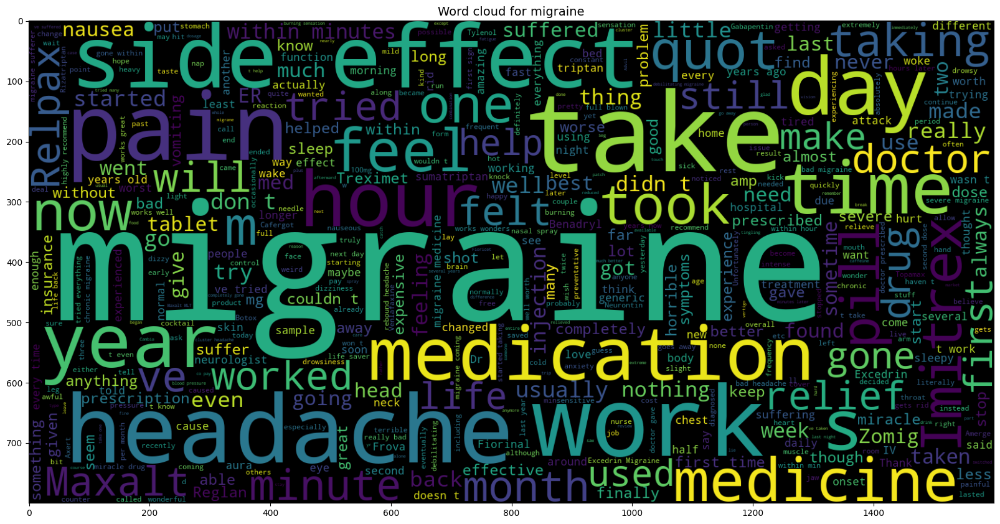

In [130]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_mig.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for migraine',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

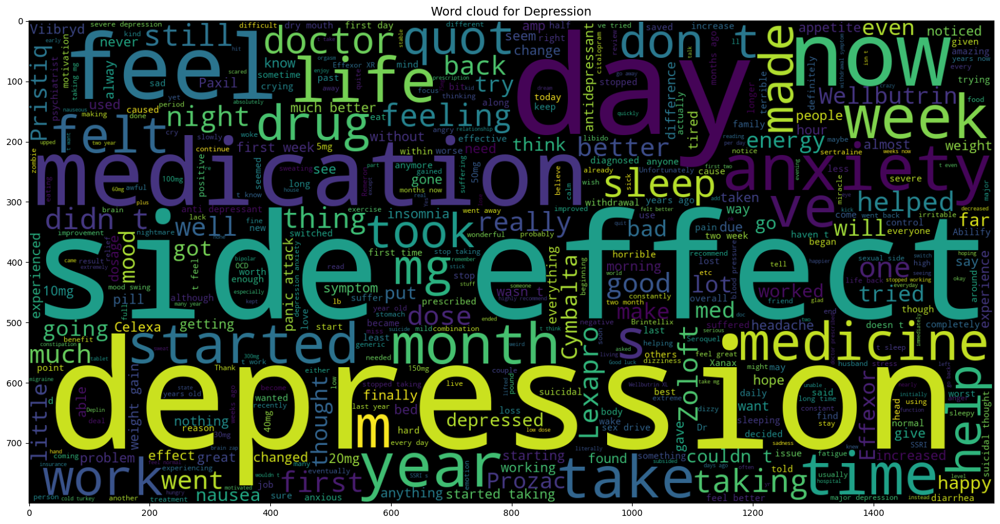

In [131]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_dep.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

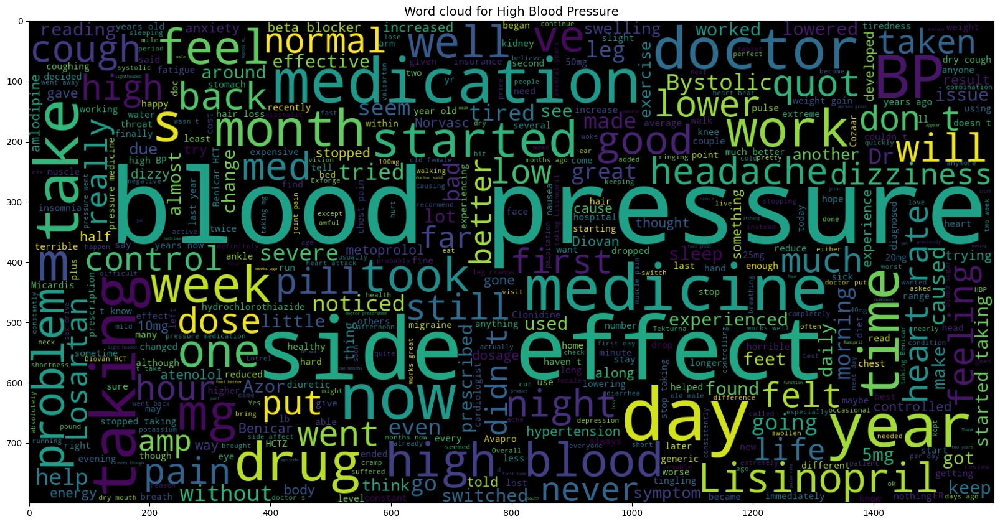

In [132]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_bp.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes type 2')

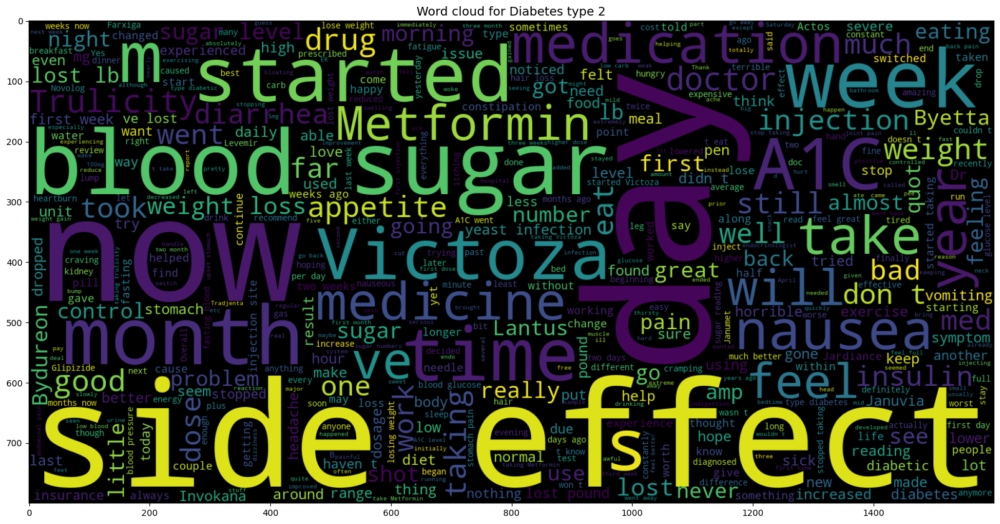

In [133]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_diab.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Diabetes type 2',fontsize=14)

Text(0.5, 1.0, 'Word cloud for ADHD')

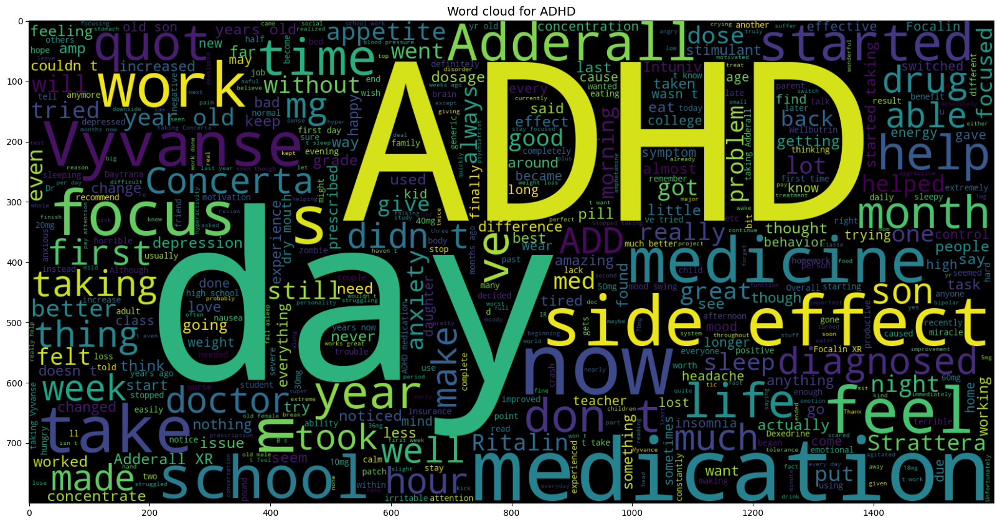

In [134]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_adh.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for ADHD',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Emergency contraception')

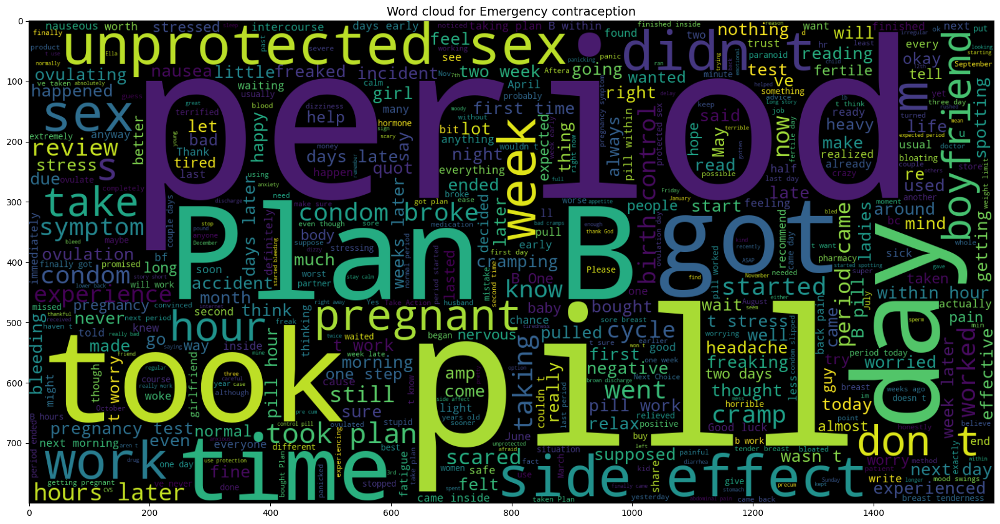

In [135]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_emrg.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Emergency contraception',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Abnormal Utiriene Bleeding')

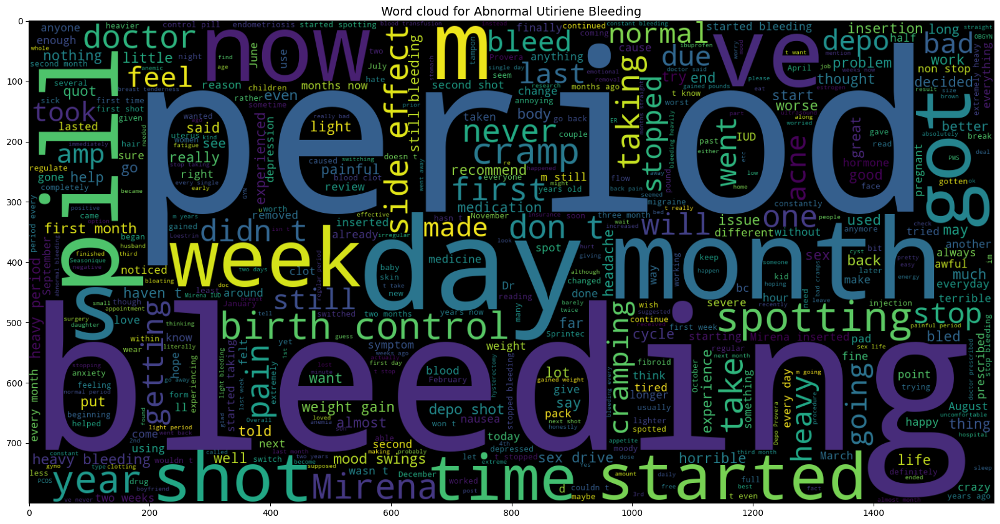

In [136]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_abnrm.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Abnormal Utiriene Bleeding',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Bowel Preparation')

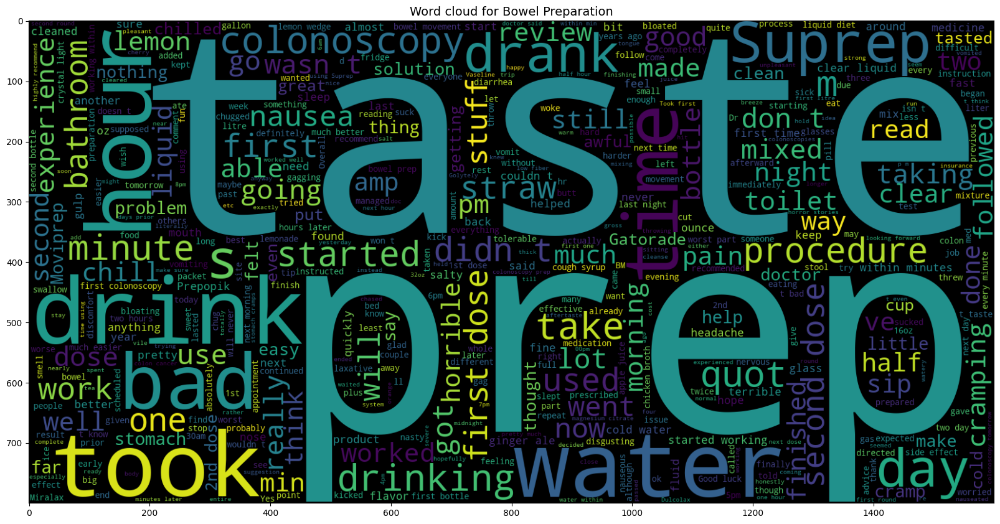

In [137]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_bwlp.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Bowel Preparation',fontsize=14)

Text(0.5, 1.0, 'Word cloud for ibromyalgia')

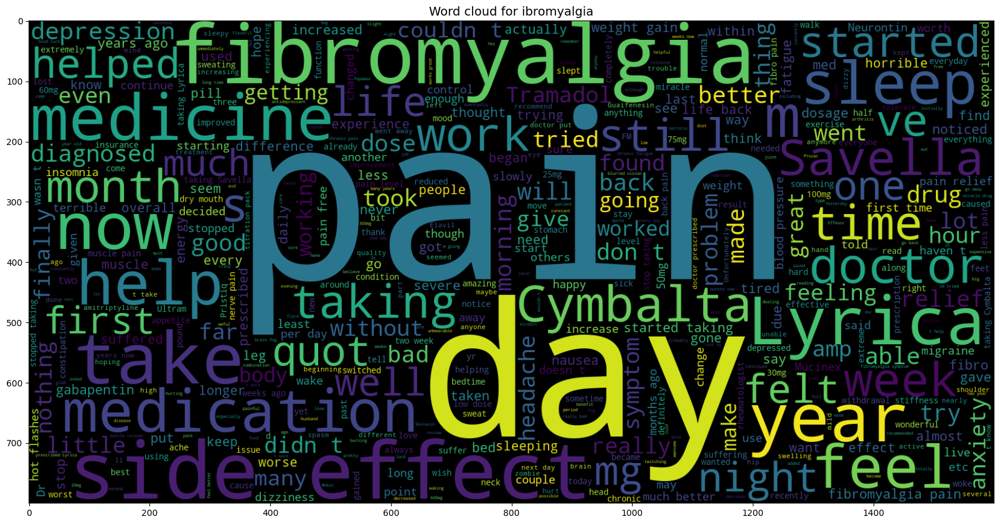

In [138]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_ibr.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for ibromyalgia',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Smoking cessation')

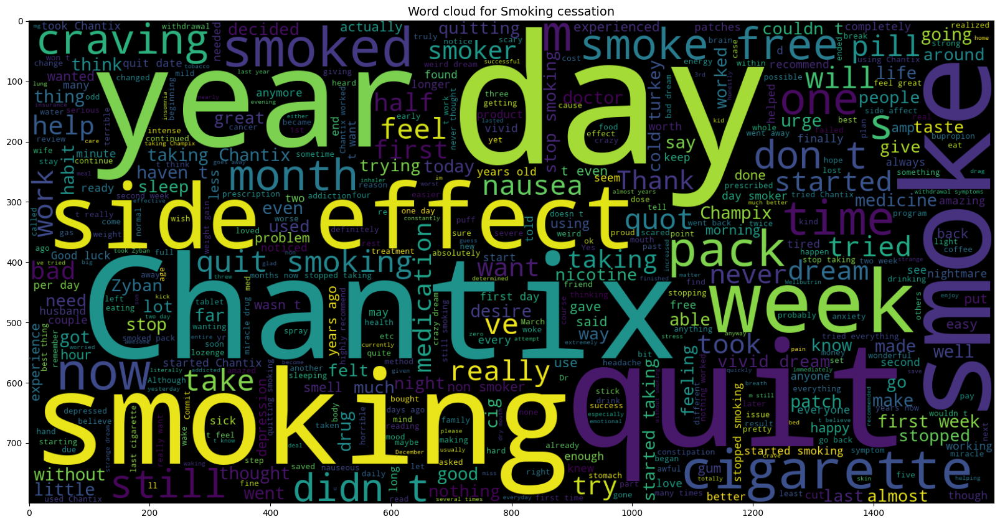

In [139]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_smk.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Smoking cessation',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Constipation')

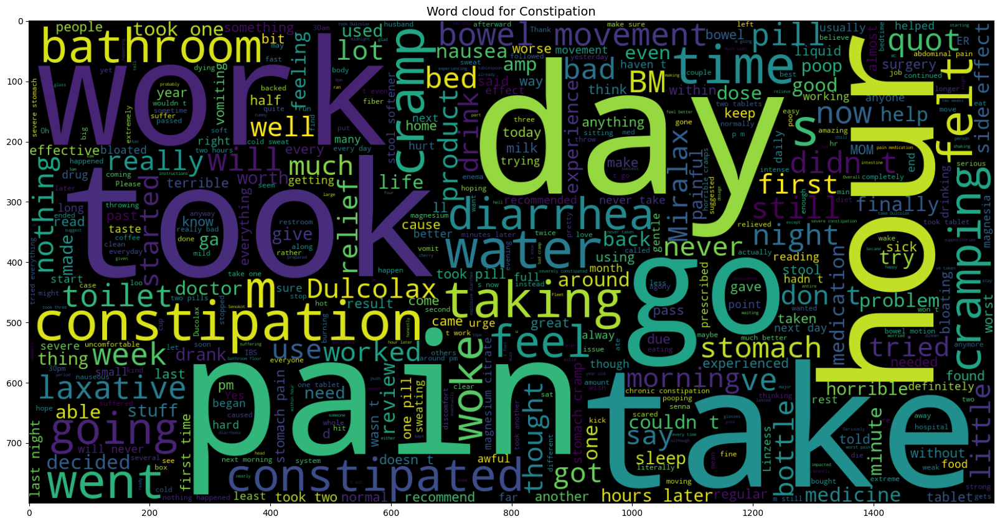

In [140]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_const.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Constipation',fontsize=14)

Text(0.5, 1.0, 'Word cloud for panic disorder')

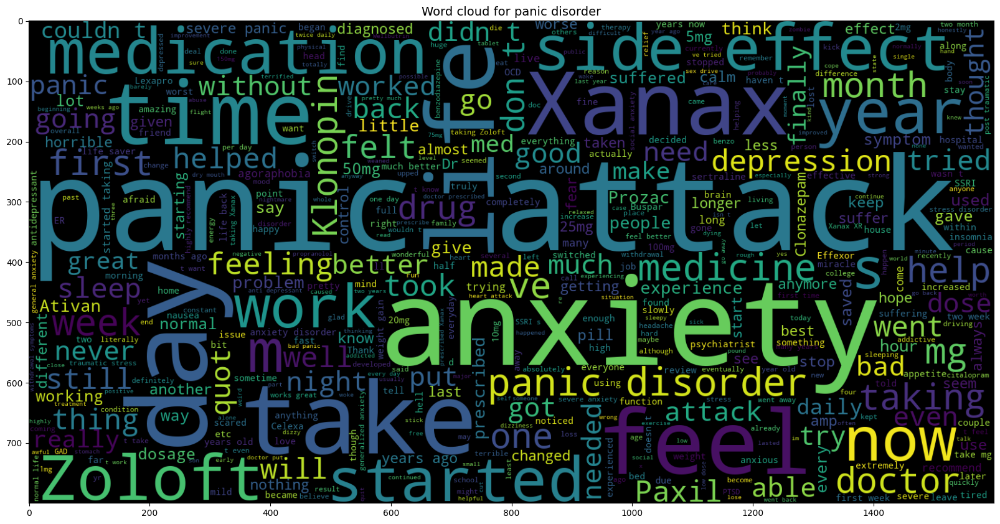

In [141]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(X_panc.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for panic disorder',fontsize=14)

## data preprocessing

In [142]:
X.iloc[2]['review']




'"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."'

In [143]:
X['review'][11]

'"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."'

In [144]:
for i, col in enumerate(X.columns):
    X.iloc[:, i] = X.iloc[:, i].str.replace('"', '')

In [145]:
# To set the width of the column to maximum
pd.set_option('max_colwidth', None)


In [146]:
X.head()

,condition,review
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective."
6,Emergency Contraception,"He pulled out, but he cummed a bit in me. I took the Plan B 26 hours later, and took a pregnancy test two weeks later - - I&#039;m pregnant."
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
17,ibromyalgia,"I&#039;ve been taking amitriptyline since January 2013 after being diagnosed with fibromyalgia. I tried cymbalta for a week and my Dr decided that since it kept me awake 24/7 that it wasn&#039;t a good fit for me even though it relieved my pain. I started with 25 mg. After 2 weeks I had some breakthrough pain, so my Dr increased my dosage to 50mg and I&#039;m still on that dosage today. For the first full year I was on this I never had pain and felt &#039;cured&#039;. As time went on, it seems to help control my pain. I do still have pain, but at a low manageable level. I take this around 7pm each evening to avoid feeling overly drowsy in the mornings. This med allows me to have a fairly normal life."
21,Insomnia,"I have insomnia, it&#039;s horrible. My story begins with my PCP prescribing me Prozac to help with intestinal issues, because I was desperate I tried it, I was on it for 3 weeks. Stopped because of insomnia. Then I was prescribed Ativan, it out me out, but was very addicting. I had rebound insomnia. Then after about 14 days I hardly any sleep l tried the doctor one more time. I asked him about Trazadone. He told me that was a good medication for insomnia. He put me on 25 mgs, but stated I may have to figure out what dosage is best for me. I am currently taking 100 mgs, which is on the low range of what is prescribed, 400 mgs being at the high end for insomnia. I have the dry mouth and nasel congestion. I can live with that, I sleep now, yeah..."


### What are stopwords ?

Stopwords are the most common words in any natural language. For the purpose of building NLP models, these stopwords might not add much value to the meaning of the document.

The most common words used in a text are **“the”, “is”, “in”, “for”, “where”, “when”, “to”, “at”** etc.

In [147]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords

stop = stopwords.words('english')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abuba\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [148]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

## Lemmitization
Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma .

In [149]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
import nltk
nltk.download('wordnet')

porter = PorterStemmer()

lemmatizer = WordNetLemmatizer()


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\abuba\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [150]:
print(porter.stem("sportingly"))
print(porter.stem("very"))
print(porter.stem("troubled"))


sportingli
veri
troubl


In [151]:

from nltk.stem import WordNetLemmatizer

 # Download the WordNet corpus if you haven't done so

lemmatizer = WordNetLemmatizer()

print(lemmatizer.lemmatize("sportingly"))
print(lemmatizer.lemmatize("very"))
print(lemmatizer.lemmatize("troubled"))


sportingly
very
troubled


In [152]:
from bs4 import BeautifulSoup
import re

In [153]:
def review_to_words(raw_review):
    # 1. Delete HTML 
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    # 2. Make a space
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    # 3. lower letters
    words = letters_only.lower().split()
    # 5. Stopwords 
    meaningful_words = [w for w in words if not w in stop]
    # 6. lemmitization
    lemmitize_words = [lemmatizer.lemmatize(w) for w in meaningful_words]
    # 7. space join words
    return( ' '.join(lemmitize_words))

In [154]:
X['review_clean'] = X['review'].apply(review_to_words)

C:\Users\abuba\AppData\Local\Temp\ipykernel_5384\2066199760.py:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review, 'html.parser').get_text()


In [155]:
X.head()

,condition,review,review_clean
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \r\nWe have tried many different medications and so far this is the most effective.",son halfway fourth week intuniv became concerned began last week started taking highest dose two day could hardly get bed cranky slept nearly hour drive home school vacation unusual called doctor monday morning said stick day see school getting morning last two day problem free much agreeable ever le emotional good thing le cranky remembering thing overall behavior better tried many different medication far effective
6,Emergency Contraception,"He pulled out, but he cummed a bit in me. I took the Plan B 26 hours later, and took a pregnancy test two weeks later - - I&#039;m pregnant.",pulled cummed bit took plan b hour later took pregnancy test two week later pregnant
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects.",taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition sinking low low major depression taking month feel like normal person first time ever best thing side effect
17,ibromyalgia,"I&#039;ve been taking amitriptyline since January 2013 after being diagnosed with fibromyalgia. I tried cymbalta for a week and my Dr decided that since it kept me awake 24/7 that it wasn&#039;t a good fit for me even though it relieved my pain. I started with 25 mg. After 2 weeks I had some breakthrough pain, so my Dr increased my dosage to 50mg and I&#039;m still on that dosage today. For the first full year I was on this I never had pain and felt &#039;cured&#039;. As time went on, it seems to help control my pain. I do still have pain, but at a low manageable level. I take this around 7pm each evening to avoid feeling overly drowsy in the mornings. This med allows me to have a fairly normal life.",taking amitriptyline since january diagnosed fibromyalgia tried cymbalta week dr decided since kept awake good fit even though relieved pain started mg week breakthrough pain dr increased dosage mg still dosage today first full year never pain felt cured time went seems help control pain still pain low manageable level take around pm evening avoid feeling overly drowsy morning med allows fairly normal life
21,Insomnia,"I have insomnia, it&#039;s horrible. My story begins with my PCP prescribing me Prozac to help with intestinal issues, because I was desperate I tried it, I was on it for 3 weeks. Stopped because of insomnia. Then I was prescribed Ativan, it out me out, but was very addicting. I had rebound insomnia. Then after about 14 days I hardly any sleep l tried the doctor one more time. I asked him about Trazadone. He told me that was a good medication for insomnia. He put me on 25 mgs, but stated I may have to figure out what dosage is best for me. I am currently taking 100 mgs, which is on the low range of what is pres

## Creating features and Target Variable

In [156]:
X_feat=X['review_clean']
y=X['condition']

In [157]:
X_train, X_test, y_train, y_test = train_test_split(X_feat, y,stratify=y,test_size=0.2, random_state=0)

In [158]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Bag of Words

In [159]:
count_vectorizer = CountVectorizer(stop_words='english')

count_train = count_vectorizer.fit_transform(X_train)

count_test = count_vectorizer.transform(X_test)

In [160]:
count_train

<33508x19580 sparse matrix of type '<class 'numpy.int64'>'
	with 984465 stored elements in Compressed Sparse Row format>

## Machine Learning Model : Naive Bayes

accuracy:   0.874
Confusion matrix, without normalization


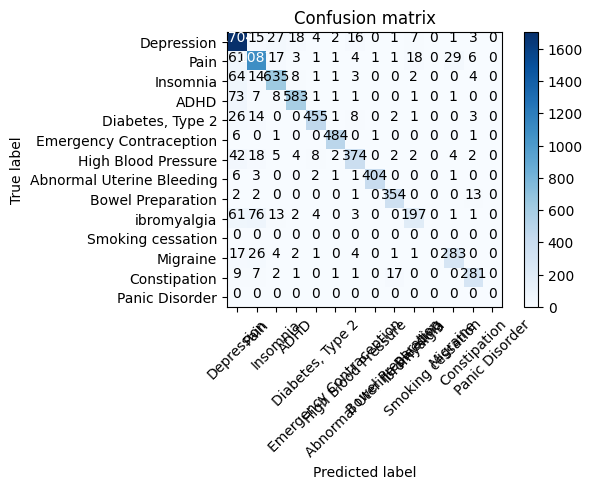

In [161]:
mnb = MultinomialNB()
mnb.fit(count_train, y_train)
pred = mnb.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)

cm = metrics.confusion_matrix(y_test, pred, labels=[ 'Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])
plot_confusion_matrix(cm, classes=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])

## Machine Learning Model : Passive Aggressive Classifier

accuracy:   0.888
Confusion matrix, without normalization


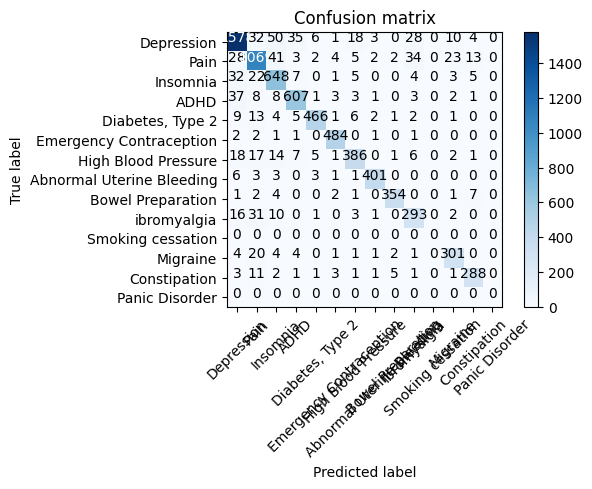

In [162]:
from sklearn.linear_model import PassiveAggressiveClassifier,LogisticRegression

passive = PassiveAggressiveClassifier()
passive.fit(count_train, y_train)
pred = passive.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])
plot_confusion_matrix(cm, classes=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])

### TFIDF

In [163]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train_2 = tfidf_vectorizer.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer.transform(X_test)

## Machine Learning Model : Naive Bayes

accuracy:   0.696
Confusion matrix, without normalization


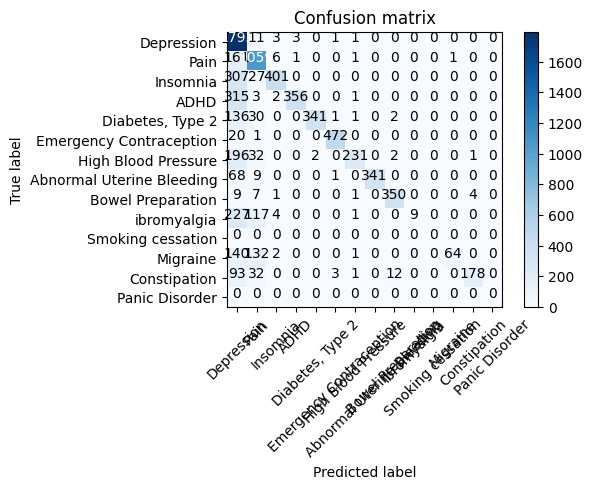

In [164]:
mnb_tf = MultinomialNB()
mnb_tf.fit(tfidf_train_2, y_train)
pred = mnb_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])
plot_confusion_matrix(cm, classes=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])

## Machine Learning Model TFIDF

accuracy:   0.905
Confusion matrix, without normalization


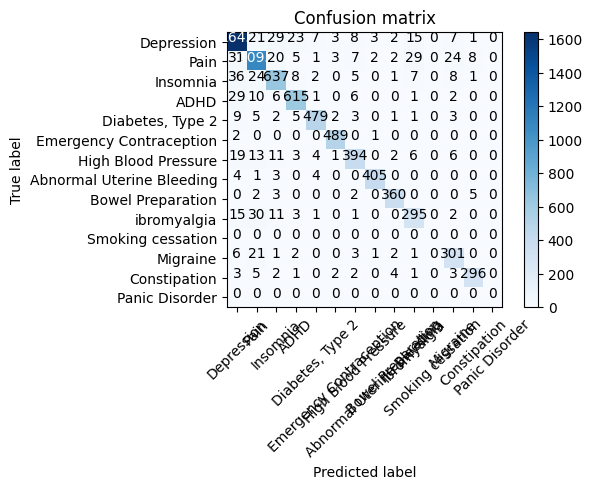

In [165]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_test = tfidf_vectorizer.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train, y_train)
pred = pass_tf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])
plot_confusion_matrix(cm, classes=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])


## TFIDF: Bigrams

In [166]:
tfidf_vectorizer2 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,2))
tfidf_train_2 = tfidf_vectorizer2.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer2.transform(X_test)

accuracy:   0.927
Confusion matrix, without normalization


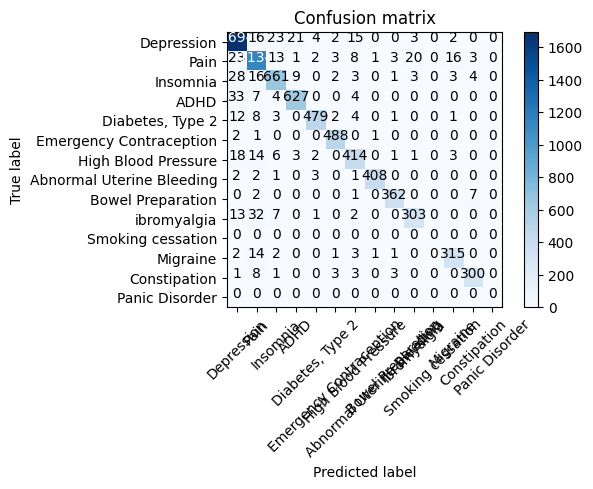

In [167]:
pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_2, y_train)
pred = pass_tf.predict(tfidf_test_2)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])
plot_confusion_matrix(cm, classes=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])

## TFIDF : Trigrams

accuracy:   0.924
Confusion matrix, without normalization


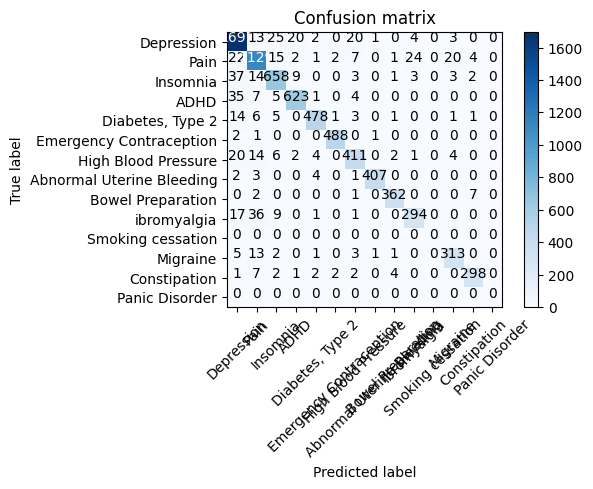

In [168]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,3))
tfidf_train_3 = tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3 = tfidf_vectorizer3.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_3, y_train)
pred = pass_tf.predict(tfidf_test_3)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred, labels=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])
plot_confusion_matrix(cm, classes=['Depression','Pain','Insomnia', 'ADHD','Diabetes, Type 2', 'Emergency Contraception','High Blood Pressure','Abnormal Uterine Bleeding','Bowel Preparation','ibromyalgia','Smoking cessation','Migraine','Constipation','Panic Disorder'])

## Most important Features

In [169]:
def most_informative_feature_for_class(vectorizer, classifier, classlabel, n=10):
    labelid = list(classifier.classes_).index(classlabel)
    feature_names = np.array(list(vectorizer.vocabulary_.keys()))
    topn = np.argsort(classifier.coef_[labelid])[-n:]

    for idx in topn:
        if idx < len(feature_names):
            coef = classifier.coef_[labelid][idx]
            feat = feature_names[idx]
            print(classlabel, feat, coef)




In [170]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Depression')

Depression shoulder gave 4.942691500244869
Depression state 4.995660368312171
Depression attempt suicidal 5.396916223682503
Depression needed day 6.145201532810321
Depression level migraine 13.374341874629943


In [171]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Pain')

Pain energized week 4.2033904260828905


In [172]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Insomnia')

Insomnia yes shot 3.5688769651085637
Insomnia change eating 5.727233773346591
Insomnia love able 10.800934471674383


In [173]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'ADHD')

ADHD busy start 5.830168623339443
ADHD narrow 7.431207223731318
ADHD er helped 7.890250698301401
ADHD help taking 8.990055303509076
ADHD close eye 12.419208799834141


In [174]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Diabetes, Type 2')

Diabetes, Type 2 eventually cracked 4.279714573388693
Diabetes, Type 2 disease spine 4.3442424167008715


In [175]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Emergency Contraception')

Emergency Contraception trazodone zoloft 3.1844101022786093
Emergency Contraception chloride citrate 5.185546185578486


In [176]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'High Blood Pressure')

High Blood Pressure mouthfull eye 3.561367887709033
High Blood Pressure awful affect 3.9543287907204654
High Blood Pressure emotionally numb 3.9567499907935595
High Blood Pressure excedrin little 3.9853100082286828
High Blood Pressure fertilisation implantation 4.77383367269805
High Blood Pressure starter sample 5.715998546846262
High Blood Pressure week built 9.546732059312806


In [177]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Abnormal Uterine Bleeding')

Abnormal Uterine Bleeding induce manic 2.8279584692070054
Abnormal Uterine Bleeding longer work 4.288392686581779
Abnormal Uterine Bleeding yeak come 4.700533498688892
Abnormal Uterine Bleeding stutter lot 9.781224650908715


In [178]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Bowel Preparation')

Bowel Preparation le issue 3.0416360679411847
Bowel Preparation company approving 7.133703722560356


In [179]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'ibromyalgia')

ibromyalgia pressure cholesteral 2.58395034966571
ibromyalgia bit lint 2.856841705112963
ibromyalgia day disappointed 3.4719252270230867
ibromyalgia scrolled 6.286114436593519
ibromyalgia stored accordance 11.01114214377949


In [180]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Smoking Cessation')

Smoking Cessation like talk 3.592348063304446
Smoking Cessation word hard 4.326440766303976
Smoking Cessation evening gave 4.908134166910115
Smoking Cessation adderall legitimate 8.379352426688559


In [181]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Migraine')

In [182]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Constipation')

Constipation home care 3.2974322711273554
Constipation sexual difficulty 3.5686060403754647
Constipation recognized easily 3.892767833754862
Constipation water useful 4.389671047914791
Constipation walked home 4.482034493368568
Constipation nucynta taking 4.647894248943754
Constipation sumatriptin 5.474147163726721


In [183]:
most_informative_feature_for_class(tfidf_vectorizer2, pass_tf, 'Panic Disorde')

Panic Disorde helped early 2.5923728333851295
Panic Disorde diarrhea suddenly 2.6522278412715647
Panic Disorde right refill 2.711686891358313
Panic Disorde gone major 2.8113692878897356
Panic Disorde depressed prone 3.028271529519277


## Sample Predictions

In [184]:
X.tail()

,condition,review,review_clean
161277,Insomnia,"I started taking this medication 10 years ago. My doctor told me it was non-narcotic and non-habit forming. Up to that time I had never had any addictions to drugs or alcohol, but unfortunately I am dependent on this drug for sleep. It does however work very well with few side effects and I wake up feeling refreshed.",started taking medication year ago doctor told non narcotic non habit forming time never addiction drug alcohol unfortunately dependent drug sleep however work well side effect wake feeling refreshed
161278,"Diabetes, Type 2",I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me,got diagnosed type doctor prescribed invokana metformin beginning sugar went normal second week losing much weight side effect yet miracle medicine
161284,Panic Disorde,"Had panic attacks and social anxiety starting in adolescence. Powered through until postpartum depression after my second child and began having severe mood swings, irritability and panic attacks (dizzy spells, heart racing, fainting, chest pain) even when I wasn&#039;t feeling stress. Started Effexor on 37.5mg and had almost immediate success (within a week). Felt a little hyper and would feel like I was getting a low jolt of electricity through my legs, but otherwise fine. Gained a bit of weight but I think that&#039;s only because I was finally able to eat without stomach pain. Increased to 70mg after two months when panic attacks began again, love this drug! Finally have a normal life.",panic attack social anxiety starting adolescence powered postpartum depression second child began severe mood swing irritability panic attack dizzy spell heart racing fainting chest pain even feeling stress started effexor mg almost immediate success within week felt little hyper would feel like getting low jolt electricity leg otherwise fine gained bit weight think finally able eat without stomach pain increased mg two month panic attack began love drug finally normal life
161286,Depression,"This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap
161290,High Blood Pressure,"I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation


In [185]:
## Function for Extracting Top drugs

def top_drugs_extractor(condition):
    df_top = df[(df['rating']>=9)&(df['usefulCount']>=100)].sort_values(by = ['rating', 'usefulCount'], ascending = [False, False])
    drug_lst = df_top[df_top['condition']==condition]['drugName'].head(3).tolist()
    return drug_lst

In [186]:
def predict_text(lst_text):
    df_test = pd.DataFrame(lst_text, columns = ['test_sent'])
    df_test["test_sent"] = df_test["test_sent"].apply(review_to_words)
    tfidf_bigram = tfidf_vectorizer3.transform(lst_text)
    prediction = pass_tf.predict(tfidf_bigram)
    df_test['prediction']=prediction
    return df_test

In [187]:
sentences = [
  
  
  
" Feelings of sadness, tearfulness, emptiness or hopelessness.Angry outbursts, irritability or frustration, even over small matters.Loss of interest or pleasure in most or all normal activities, such as sex, hobbies or sports.Sleep disturbances, including insomnia or sleeping too much.Tiredness and lack of energy, so even small tasks take extra effort.Reduced appetite and weight loss or increased cravings for food and weight gain.Anxiety, agitation or restlessness.Slowed thinking, speaking or body movements.Feelings of worthlessness or guilt, fixating on past failures or self-blame.Trouble thinking, concentrating, making decisions and remembering things .Frequent or recurrent thoughts of death, suicidal thoughts, suicide attempts or suicide . Unexplained physical problems, such as back pain or headachesI have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.I only take Cymbalta now mostly for pain.When I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
"Aching.Burning.Shooting.Squeezing.Stiffness.Stinging.Throbbing.I am 30 years old. I had a multiple composite spinal injuries 15 years ago. The aches and pains unbearable. I started taking anti-inflammatories about 2 years ago. I started getting injections every month of Toradol and &quot;Depo&quot; something. I am almost off all pain meds I mean I still have bad days but I can function again."
" find it hard to go to sleep.wake up several times during the night.lie awake at night.wake up early and cannot go back to sleep.still feel tired after waking up.find it hard to nap during the day even though you're tired.feel tired and irritable during the day.I have insomnia, it&#039;s horrible. My story begins with my PCP prescribing me Prozac to help with intestinal issues, because I was desperate I tried it, I was on it for 3 weeks. Stopped because of insomnia. Then I was prescribed Ativan, it out me out, but was very addicting. I had rebound insomnia. Then after about 14 days I hardly any sleep l tried the doctor one more time. I asked him about Trazadone. He told me that was a good medication for insomnia. He put me on 25 mgs, but stated I may have to figure out what dosage is best for me. I am currently taking 100 mgs, which is on the low range of what is prescribed, 400 mgs being at the high end for insomnia. I have the dry mouth and nasel congestion. I can live with that, I sleep now, yeah..."
" being unable to sit still, especially in calm or quiet surroundings.constantly fidgeting.being unable to concentrate on tasks.excessive physical movement.excessive talking.being unable to wait their turn.acting without thinking.interrupting conversations.My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. We have tried many different medications and so far this is the most effective."
" Increased thirst.Frequent urination.Increased hunger.Unintended weight loss.Fatigue.Blurred vision.Slow-healing sores.Frequent infections.Hey Guys,  It&#039;s been 4 months since my last post as I wanted to give it a few months to see how this was going to work.  So, I have been on Trulicity for six months now with Metformin.  When I hit the five month period the diarrhea, gas, sulphur belching finally subsided.  I now longer have any of those side effects.  However, I still haven&#039;t lost any weight at all, but I think that was because when I first started Trulicity I was taking it with Glimepiride and that one has a side effect of weight gain so I think the two meds were fighting each other lol.  I have been back on the Metformin with Trulicity for about a week now, so we will see what this does.  I was diagnosed as  stage 3 chronic kidney disease (CKD 3) so I am watching diet closely."
" Nausea or vomiting.Dizziness.Fatigue.Headache.Breast tenderness.Bleeding between periods or heavier menstrual bleeding.Lower abdominal pain or cramps.Had sex on the 7th of August. Took Plan B about 23 hours after from the intercourse. Haven&#039;t gotten my period yet because I&#039;m not supposed to be due until the 20th of August but a major side effect that I&#039;ve been experiencing is a MAJOR amount of tiredness and exhaustion! When I got home from work the day after I took the pill, I went upstairs around 9pm to sleep and woke up the next day around 1pm. I wake up extremely exhausted and my feet start to get tired as well. Also I barely ever hungry anymore... I&#039;m 18 years old so this is very unusual for a teen... Hopefully my period comes soon."
" severe headaches.chest pain.dizziness.difficulty breathing.nausea.vomiting.blurred vision or other vision changes.anxiety.My blood pressure has been around 160/100. Doctor prescribed Azor 40/10. Just 4 hrs later my reading showed 120/82. I was amazed. I am now on it daily. Thanks to Azor."
" Bleeding or spotting between periods.Bleeding after sex.Bleeding more heavily (passing large clots, needing to change protection during the night, soaking through a sanitary pad or tampon every hour for 2 to 3 hours in a row)I was having severe bleeding with large clots which lasted for 3 weeks. Finally saw the Doctor and he gave me 10mg for 10 days. This is day 9. I stopped bleeding 2 days ago. I love this medicine, really. I&#039;m hungry more often, but that&#039;s okay. Unsure what will happen when I stop taking it."
"I took the Prepopik for my first colonoscopy (I&#039;m 25) and I found it to be very effective. The orange flavor was very tolerable. I had no bad cramps or terrible side effects with it, but I had taken magnesium citrate the night before and that had already cleaned me out somewhat. My only issue was I ended up so dehydrated that I showed up to my colonoscopy with a fever. Try to drink as much fluid as you can with this prep! I drank plenty, but there was more liquid coming out of me than going in. Overall, I would recommend the Prepopik. On a side note, my insurance didn&#039;t cover it, but the office I go to had it available. I recommend asking your office if they have it available if insurance won&#039;t cover it at the pharmacy."
" Pain and stiffness all over the body.Fatigue and tiredness.Depression and anxiety.Sleep problems.Problems with thinking, memory, and concentration.Headaches, including migraines.Helped me to stop crying on a daily basis which I was doing because of my Fibromyalgia pain. Still have the pain, but have a better attitude."
"Having urges or cravings to smoke. ...Feeling irritated, grouchy, or upset. ...Feeling jumpy and restless. ...Having a hard time concentrating. ...Having trouble sleeping. ...Feeling hungrier or gaining weight. ...Feeling anxious, sad, or depressed.Love this, no mouth sores, or ulcers like Wellbutrin gave me. I COMPLETELY QUIT SMOKING...this works."
" headache pain that occurs without warning and is usually felt on one side of the head, along with nausea, confusion, blurred vision, mood changes, fatigue, and increased sensitivity to light, sound, or noise.The only migraine medicine that has ever worked on me.  Now my insurance company will not cover it. Guess I will have to pay for it.  It works that good!"
" fewer than three bowel movements a week.stools that are hard, dry, or lumpy.stools that are difficult or painful to pass.a feeling that not all stool has passed.Helped me to stop crying on a daily basis which I was doing because of my Fibromyalgia pain. Still have the pain, but have a better attitude."
" Pounding or racing heart.Sweating.Chills.Trembling.Difficulty breathing.Weakness or dizziness.Tingly or numb hands.Chest pain.Honestly, I have been taking ativan for 2 years now 1mg twice daily.  It does help but it should be used as a tool for panic attacks NOT A SOLUTION.  I have tried so many anti-depressants as well such as cymbalta, cipralex and a couple more.  The best thing is to talk to close friends and family or even a psychiatrist.  talking to people and venting is honestly the best thing you can do for yourself even though it takes a lot of will power to do it.  I would love to hear other people opinion."

  
  
  
  
  
  
  
  
  
   ]

In [188]:
tfidf_trigram = tfidf_vectorizer3.transform(sentences)


predictions = pass_tf.predict(tfidf_trigram)

for text, label in zip(sentences, predictions):
    if label=="Depression":
        target="Depression"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Pain":
        target="Pain"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Insomnia":
        target="Insomnia"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="ADHD":
        target="ADHD"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Diabetes, Type 2":
        target="Diabetes, Type 2"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Emergency Contraception":
        target="Emergency Contraception"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="High Blood Pressure":
        target="High Blood Pressure"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Abnormal Uterine Bleeding":
        target="Abnormal Uterine Bleeding"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Bowel Preparation":
        target="Bowel Preparation"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Ibromyalgia":
        target="Ibromyalgia"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Smoking cessation":
        target="Smoking cessation"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Migraine":
        target="Migraine"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Constipation":
        target="Constipation"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    else:
        target="Panic Disorde"
        print("text:", text, "\Condition:", target)
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()

text:  Feelings of sadness, tearfulness, emptiness or hopelessness.Angry outbursts, irritability or frustration, even over small matters.Loss of interest or pleasure in most or all normal activities, such as sex, hobbies or sports.Sleep disturbances, including insomnia or sleeping too much.Tiredness and lack of energy, so even small tasks take extra effort.Reduced appetite and weight loss or increased cravings for food and weight gain.Anxiety, agitation or restlessness.Slowed thinking, speaking or body movements.Feelings of worthlessness or guilt, fixating on past failures or self-blame.Trouble thinking, concentrating, making decisions and remembering things .Frequent or recurrent thoughts of death, suicidal thoughts, suicide attempts or suicide . Unexplained physical problems, such as back pain or headachesI have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.I only take Cymbalta now mostly for pain.When I

In [189]:
df_testsent = predict_text(sentences)
df_testsent

test_sent  \
0  feeling sadness tearfulness emptiness hopelessness angry outburst irritability frustration even small matter loss interest pleasure normal activity sex hobby sport sleep disturbance including insomnia sleeping much tiredness lack energy even small task take extra effort reduced appetite weight loss increased craving food weight gain anxiety agitation restlessness slowed thinking speaking body movement feeling worthlessness guilt fixating past failure self blame trouble thinking concentrating making decision remembering thing frequent recurrent thought death suicidal thought suicide attempt suicide unexplained physical problem back pain headachesi taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition sinking low low major depression taking month feel like normal person first time ever best thing side effect aching burning shooting squeezing stiffness stinging throbbing year old multiple composite spinal injury year ago ache pain unbearable started taking anti inflammatories year ago started getting injection every month toradol depo something almost pain med mean still bad day function find hard go sleep wake several time night lie awake night wake early cannot go back sleep still feel tired waking find hard nap day even though tired feel tired irritable day insomnia horrible story begin pcp prescribing prozac help intestinal issue desperate tried week stopped insomnia prescribed ativan addicting rebound insomnia day hardly sleep l tried doctor one time asked trazadone told good medication insomnia put mg stated may figure dosage best currently taking mg low range prescribed mg high end insomnia dry mouth nasel congestion live sleep yeah unable sit still especially calm quiet surroundings constantly fidgeting unable concentrate task excessive physical movement excessive talking unable wait turn acting without thinking interrupting conversation son halfway fourth week intuniv became concerned began last week started taking highest dose two day could hardly get bed cranky slept nearly hour drive home school vacation unusual called doctor monday morning said stick day see school getting morning last two day problem free much agreeable ever le emotional good thing le cranky remembering thing overall behavior better tried many different medication far effective increased thirst frequent urination increased hunger unintended weight loss fatigue blurred vision slow healing sore frequent infection hey guy month since last post wanted give month see going work trulicity six month metformin hit five month period diarrhea gas sulphur belching finally subsided longer side effect however still lost weight think first started trulicity taking glimepiride one side effect weight gain think two med fighting lol back metformin trulicity week see diagnosed stage chronic kidney disease ckd watching diet closely nausea vomiting dizziness fatigue headache breast tenderness bleeding period heavier menstrual bleeding lower abdominal pain cramp sex th august took plan b hour intercourse gotten period yet supposed due th august major side effect experiencing major amount tiredness exhaustion got home work day took pill went upstairs around pm sleep woke next day around pm wake extremely exhausted foot start get tired well also barely ever hungry anymore year old unusual teen hopefully period come soon severe headache chest pain dizziness difficulty breathing nausea vomiting blurred vision vision change anxiety blood pressure around doctor prescribed azor hr later reading showed amazed daily thanks azor bleeding spotting period bleeding sex bleeding heavily passing large clot needing change protection night soaking sanitary pad tampon every hour hour row severe bleeding large clot lasted week finally saw doctor gave mg day day stopped bleeding day ago love medicine really hungry often okay unsure happen stop tak

In [190]:
import joblib
joblib.dump(tfidf_vectorizer3, 'tfidf2.pkl')
joblib.dump(pass_tf, 'pasmodel2.pkl')

['pasmodel2.pkl']

In [191]:
vectorizer = joblib.load('tfidf2.pkl')
model = joblib.load('pasmodel2.pkl')

test = model.predict(vectorizer.transform(["I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations"]))
test[0]

'High Blood Pressure'